# Imports

In [41]:
!pip install qiskit==1.3
!pip install qiskit-aer==0.15
!pip install pylatexenc==2.10
!pip install qiskit_ibm_runtime==0.34.0
!pip install qiskit-experiments

   ---------------------------------------- 0.0/633.4 kB ? eta -:--:--
   --------------------------------------- 633.4/633.4 kB 11.6 MB/s eta 0:00:00


In [2]:
import qiskit
import qiskit_aer
from qiskit.quantum_info import Statevector, Operator, state_fidelity, random_statevector
from qiskit_experiments.library import StateTomography
from qiskit.circuit.library import real_amplitudes, EfficientSU2, TwoLocal, PauliTwoDesign
from qiskit import QuantumCircuit, transpile
from qiskit_aer import AerSimulator, Aer
from qiskit_aer.noise import NoiseModel, depolarizing_error
from qiskit_ibm_runtime import QiskitRuntimeService, SamplerV2, EstimatorV2
import random
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib.ticker import ScalarFormatter
from math import ceil
import numpy as np
import time
import math
from scipy.optimize import minimize
from scipy.stats import unitary_group, ortho_group
print(f"Qiskit version: {qiskit.__version__}")
print(f"Qiskit-Aer version: {qiskit_aer.__version__}")

Qiskit version: 1.3.0
Qiskit-Aer version: 0.15.0


# Getting Cost vs Iterations

The VQLS algorithm is designed to solve linear systems, of which we will consider the form Ax=b. For some sense of standardization among these first trials, we use the same A and b, as generated in the following block. We use unitary_group.rvs to store the unitary operator A in the variable rv. To ensure the system is actually solvable, we take the b of interest to equal Ax with matrix multiplication for some arbitrary x. The rv (operator) and b (as a statevector) are stored for later use.

In our cost function, we assign the parameters to the parameterized ansatz, making x(theta), and evalute Ax(theta). The fidelity between Ax(theta) and the b statevector measures how close the two are, so what we want to minimize (the cost) is 1-fidelity. As each cost function is evaluated (in the iterations of the minimize function), we store the cost in the list cost_list.

In [219]:
# noise model, optional
noise_model = NoiseModel()
dep_error_1q = depolarizing_error(0.01, 1)
dep_error_2q = depolarizing_error(0.02, 2)
noise_model.add_all_qubit_quantum_error(dep_error_1q, ['rx', 'ry', 'rz'])
noise_model.add_all_qubit_quantum_error(dep_error_2q, ['cx'])

def cost_func(params, ansatz, b_state, A, cost_list, isNoisy):
    bound_ansatz = ansatz.assign_parameters(params) # assigns the parameters to the parameterized ansatz
    op = Operator(A) # creates the operator op from the matrix A
    bound_ansatz.unitary(op, list(range(bound_ansatz.num_qubits))) # applies the operator op to the ansatz - bound_ansatz now models the state Ax(theta)
    bound_ansatz.save_statevector() 

    if (isNoisy): #applies noise model if isNoisy is True, else just uses regular aer simulator
        backend = AerSimulator(noise_model=noise_model)
    else:
        backend = Aer.get_backend('aer_simulator')

    transpiled_ansatz = transpile(bound_ansatz, backend) #transpiles the ansatz to the backend
    result = backend.run(transpiled_ansatz, shots=100).result() # runs the ansatz and gets the result
    ansatz_state = result.get_statevector(transpiled_ansatz, decimals=10) #gets the statevector of Ax(theta) with aer simulator

    cost = 1 - state_fidelity(ansatz_state, b_state) # define cost as 1 - fidelity, we want to minimize cost, so we want to maximize fidelity
    cost_list.append(cost) # appends the fidelity to the fidelity list
    return cost

We now run COBYLA to minimize the cost function by altering the parameters of the ansatz. We initiate all of the parameters as 1, for consistency. We keep the list of costs

In [220]:
def minimize_cost(ansatz, b_state, A, func, maxiterations):
    cost_list = []
    minimize(func, x0 = np.ones(ansatz.num_parameters), args=(ansatz, b_state, A, cost_list, False), method='COBYLA', options={'maxiter': maxiterations})
    return cost_list

We generate graphs of the cost list. The first graph shows cost plotted against iteration number directly. Then are 8 subgraphs per overall graph.

In [95]:
def generate_graph(cost_list, title):

    plt.plot(range(len(cost_list)), cost_list) 


    plt.xlabel('Iteration')
    plt.ylabel('Cost')
    plt.title('Cost vs Iteration for ' + title)
    plt.grid(True)
    plt.show()
    
    #for subplots
    n_subplots = 8
    n_cols = 4
    n_rows = 2

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))
    axes = np.array(axes).flatten()

    formatter = ScalarFormatter(useOffset=False, useMathText=False)
    formatter.set_scientific(False)

    chunk_size = ceil(len(cost_list) / n_subplots)

    for i in range(n_subplots):
        ax = axes[i]

        start = i * chunk_size
        end = min(start + chunk_size, len(cost_list))
        chunk = cost_list[start:end]

        ax.plot(range(start, end), cost_list[start:end], marker='o')
        ax.set_title(f'Cost vs Iteration {start} to {end} for {title}')
        ax.set_xlabel('Iteration')
        ax.set_ylabel('Cost')
        ax.grid(True)

        ax.yaxis.set_major_formatter(formatter)
    

    
    plt.tight_layout()
    plt.show()

This graph plots multiple sets of data on the same graph. It displays it first over the full range of the data, and one with a more consolidated area. That area is then put into a certain number of subplots, as specified in the appropriate argument. 

In [305]:
def generate_combined_graph(cost_lists, num_subplots, cap, title):

    formatter = ScalarFormatter(useOffset=False, useMathText=False)
    formatter.set_scientific(False)

    fig, axes = plt.subplots(1, 2, figsize=(20, 6))
    axes = axes.flatten()
    for i in range(2):
        ax= axes[i]
        for label, costs in cost_lists.items():
            ax.plot(range(len(costs)), costs, label=label)  
        ax.set_xlabel('Iteration #')
        ax.set_ylabel('Cost')
        ax.set_title(title)
        ax.legend()
        ax.grid(True)
        if (i == 1):
            ax.set_xlim(0,cap)
    plt.tight_layout
    plt.show()

    ranges = []
    for i in range(num_subplots):
        start = i * (cap // num_subplots) + 1
        end = (i + 1) * (cap // num_subplots)
        ranges.append((start, end))
    fig, axes = plt.subplots(int(num_subplots/3),3,figsize=(20,15))
    axes = axes.flatten()

    for i, (start, end) in enumerate(ranges):
        ax = axes[i]
        for label, costs in cost_lists.items():
            iterations = range(start, end+1)
            ax.plot(iterations, costs[start:end+1], label=label)
        ax.set_title(f'Cost vs Iteration for {start}-{end}')
        ax.set_xlabel('Iteration')
        ax.set_ylabel('Cost')
        ax.yaxis.set_major_formatter(formatter)
        ax.legend()
        ax.grid(True)
    if (num_subplots != 0):
        plt.show()

## Minimization, running the algorithm for two-qubit systems

In [3]:
rv = unitary_group.rvs(dim=4)
vec = random_statevector(4) #arbitary statevector of x, to ensure system is solvable later
vector = vec.data
b = np.matmul(rv, vector) #find a b vector that can actually be reached by Ax(theta), so the system is solvable
b_state = Statevector(b) #statevector of the array for b
print("rv: ", rv)
print("b_state: ", b_state)

rv:  [[-0.09398794-0.57157313j -0.11494723-0.20130435j  0.64867863+0.04451263j
   0.32136128-0.29102527j]
 [ 0.19394946-0.26707771j -0.22791941+0.42856389j -0.18298486-0.48080689j
   0.51948956+0.34772218j]
 [ 0.12690275+0.55697816j  0.52242825+0.06771551j  0.43281442-0.27626352j
   0.35692476-0.0714788j ]
 [ 0.15463613-0.45308081j  0.55868644+0.34785374j  0.16450156-0.14786926j
  -0.51472011+0.15430425j]]
b_state:  Statevector([-0.30036801-0.3873193j , -0.29042752+0.19976832j,
              0.38485819-0.31550233j, -0.58151818-0.22290435j],
            dims=(2, 2))


We run the regular VQLS for the different ansatze, then graph them.

In [223]:
ansatz1 = EfficientSU2(2, reps=2, entanglement='linear')
ESU2_costs = minimize_cost(ansatz1, b_state, rv, cost_func, 1000)
ansatz2 = TwoLocal(num_qubits=2, rotation_blocks=['rx', 'rz'], entanglement_blocks='cx', entanglement='linear', reps=2)
TwoLocal_costs = minimize_cost(ansatz2, b_state, rv, cost_func, 1000)
ansatz3 = PauliTwoDesign(num_qubits=2, reps=2)
PauliTwo2_costs = minimize_cost(ansatz3, b_state, rv, cost_func, 1000)

In [ ]:
print("EfficientSU2 with 2 qubits and 2 reps has " + str(ansatz1.num_parameters) + " parameters")
print("TwoLocal with 2 qubits and 2 reps has " + str(ansatz2.num_parameters) + " parameters")
print("PauliTwo with 2 qubits and 2 reps has " + str(ansatz3.num_parameters) + " parameters")

EfficientSU2 with 2 qubits and 2 reps has 12 parameters
PauliTwo with 2 qubits and 2 reps has 6 parameters
TwoLocal with 2 qubits and 2 reps has 12 parameters


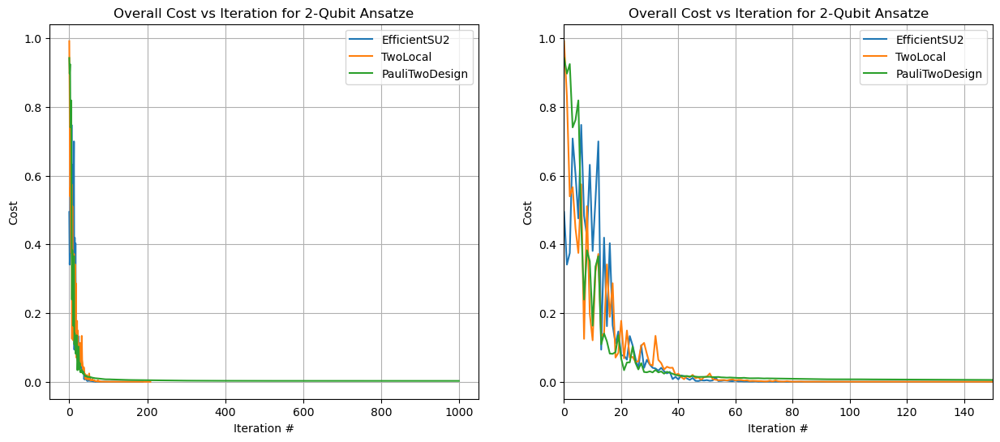

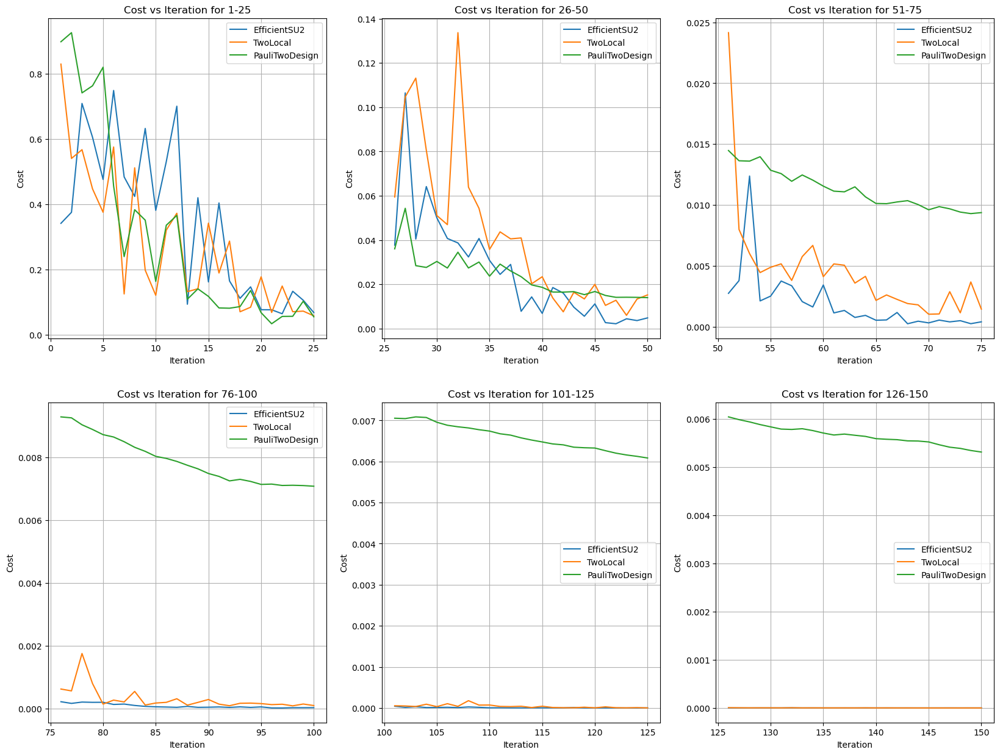

In [279]:
costs_dict = {
    'EfficientSU2': ESU2_costs,
    'TwoLocal': TwoLocal_costs,
    'PauliTwoDesign': PauliTwo2_costs
}
generate_combined_graph(costs_dict, 6, 150, "Overall Cost vs Iteration for 2-Qubit Ansatze")

Let us now analyze the Graphs for the EfficientSU2 and TwoLocal ansatze, which had relatively close cost values, as compared to the PauliTwoDesign ansatz.

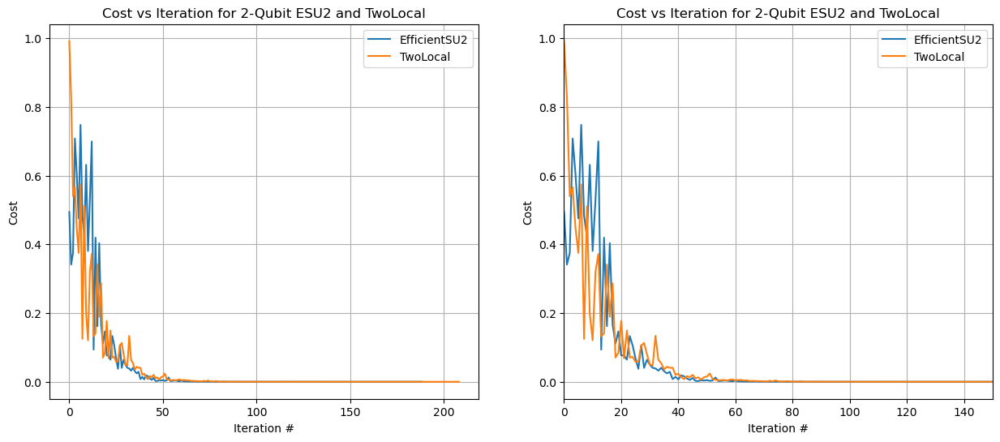

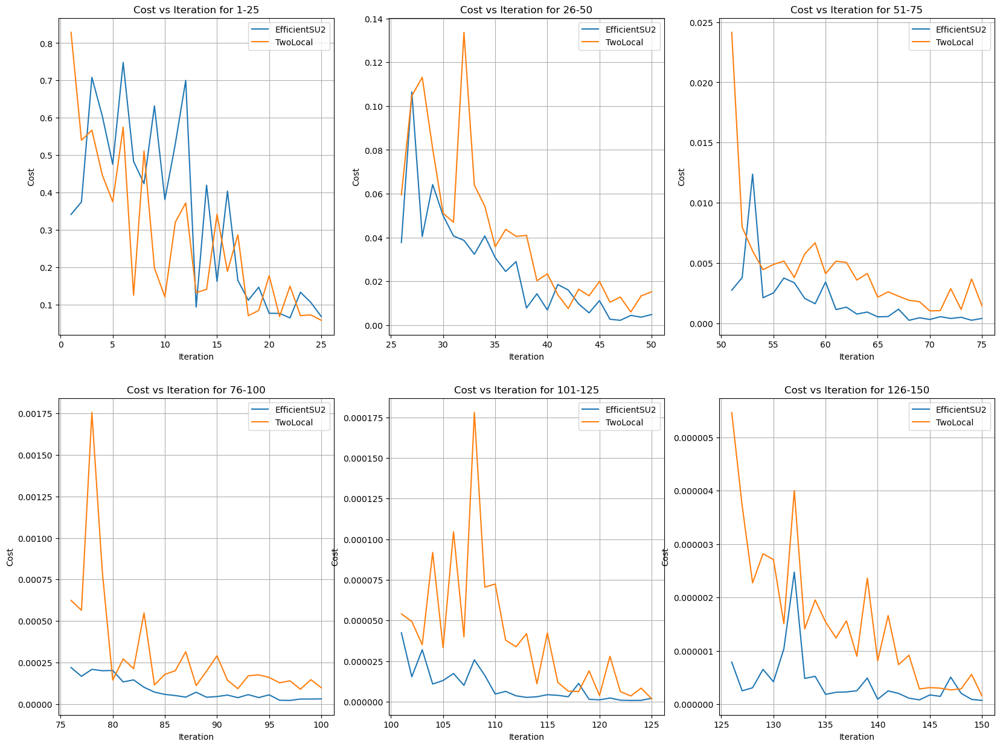

In [ ]:
et_costs_dict = { #dictionary of costs with just EfficientSU2 and TwoLocal
    'EfficientSU2': ESU2_costs,
    'TwoLocal': TwoLocal_costs
}
generate_combined_graph(et_costs_dict, 6, 150, "Cost vs Iteration for 2-Qubit ESU2 and TwoLocal")

We may also just graph each of the costs over iteration independently:

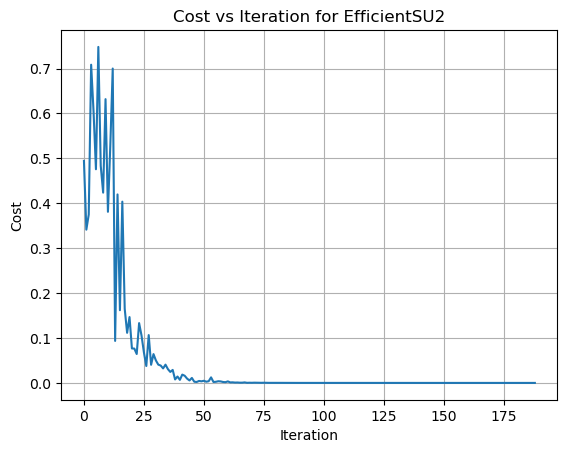

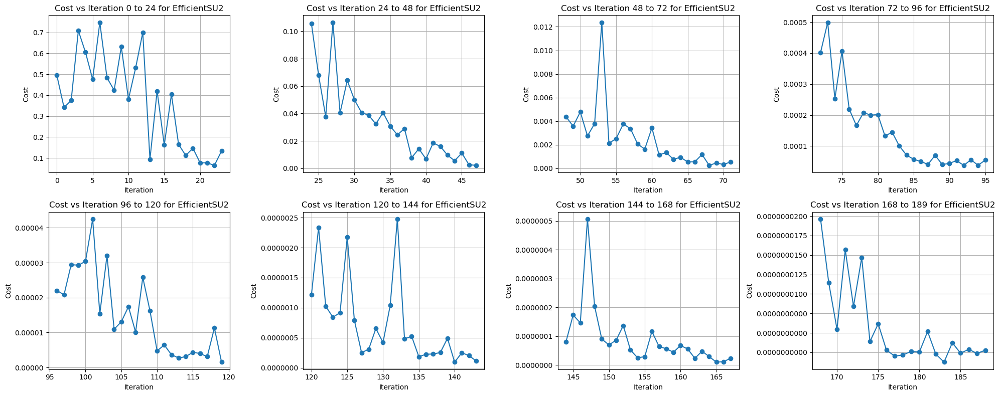

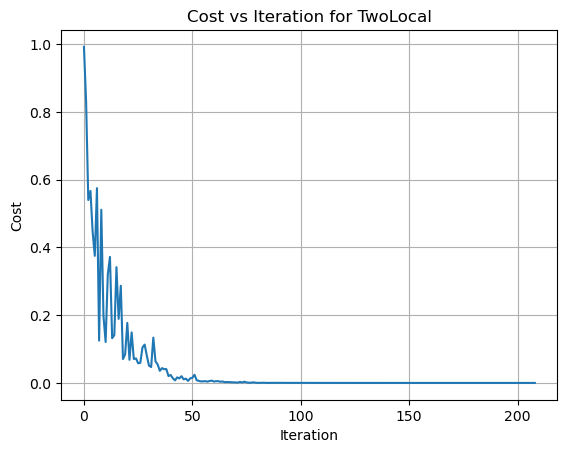

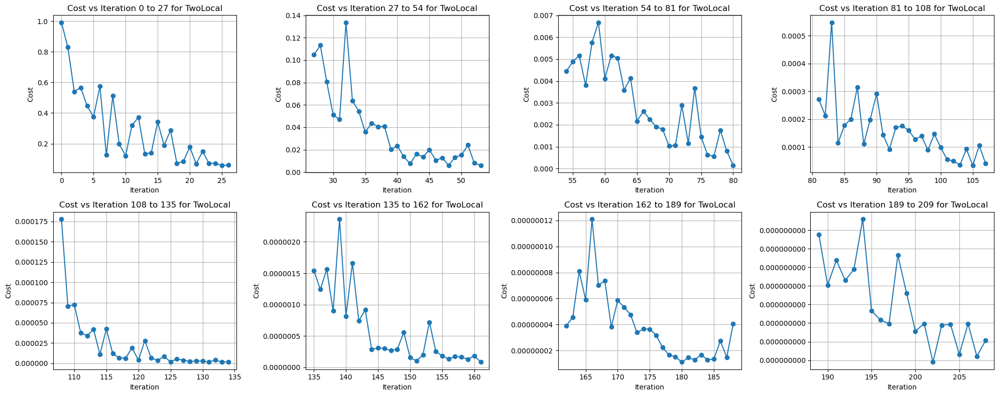

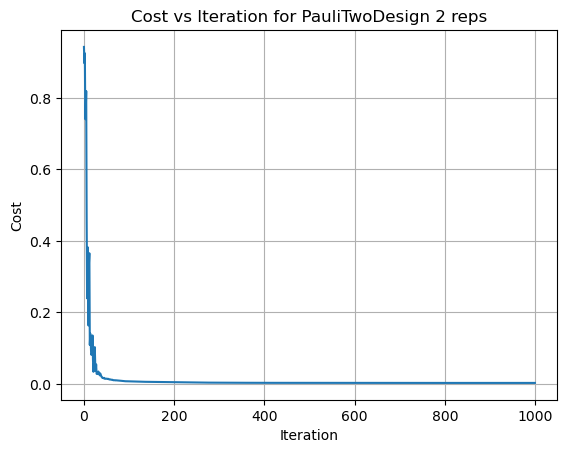

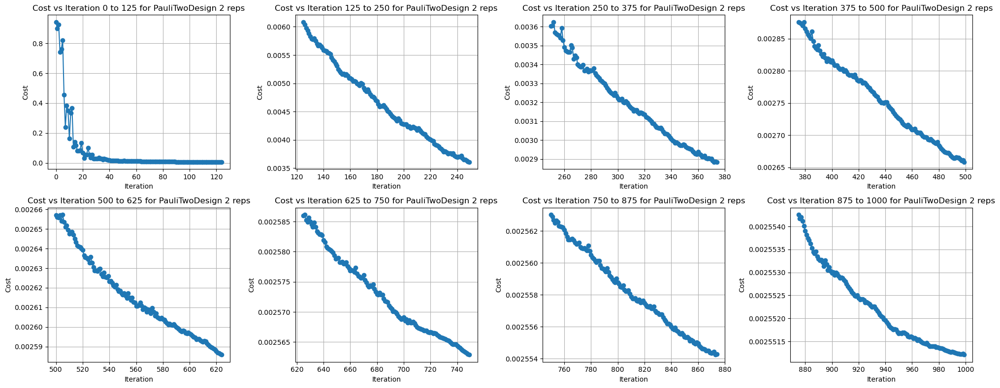

In [246]:
generate_graph(ESU2_costs, 'EfficientSU2')
generate_graph(TwoLocal_costs, 'TwoLocal')
generate_graph(PauliTwo2_costs, 'PauliTwoDesign 2 reps')

## Minimization for 4 qubit circuits

We now consider a larger scale run of the algorithm, with 4-qubit circuits rather than 2-qubits ones. Note that for n qubits, the dimensions of the matrices/vectors involve scale with $2^n$. Like with the 2-qubit case, here we define a unitary operator and a final state that are compatible with a 4-qubit system.

In [67]:
op = unitary_group.rvs(dim=16)
vec = random_statevector(16) #arbitary statevector of x, to ensure system is solvable later
vector = vec.data
b1 = np.matmul(op, vector) #find a b vector that can actually be reached by Ax(theta), so the system is solvable
b1_state = Statevector(b1) #statevector of the array for b

Again, we run and graph them. This time, we exclude the individual graphs of for each ansatz, keeping only the combined graphs for conciseness.

In [230]:
ansatz4 = EfficientSU2(4, reps=4, entanglement='linear')
ESU2_costs1 = minimize_cost(ansatz4, b1_state, op, cost_func, 1000)
ansatz5 = TwoLocal(num_qubits=4, rotation_blocks=['rx', 'rz'], entanglement_blocks='cx', entanglement='linear', reps=4)
TwoLocal_costs1 = minimize_cost(ansatz5, b1_state, op, cost_func, 1000)
ansatz6 = PauliTwoDesign(num_qubits=4, reps=4)
PauliTwo4_costs1 = minimize_cost(ansatz6, b1_state, op, cost_func, 1000)

In [ ]:
print("EfficientSU2 with 4 qubits and 4 reps has " + str(ansatz4.num_parameters) + " parameters")
print("PauliTwo with 4 qubits and 4 reps has " + str(ansatz5.num_parameters) + " parameters")
print("PauliTwo with 4 qubits and 4 reps has " + str(ansatz6.num_parameters) + " parameters")

EfficientSU2 with 4 qubits and 2 reps has 24 parameters
PauliTwo with 4 qubits and 2 reps has 24 parameters
PauliTwo with 4 qubits and 2 reps has 12 parameters


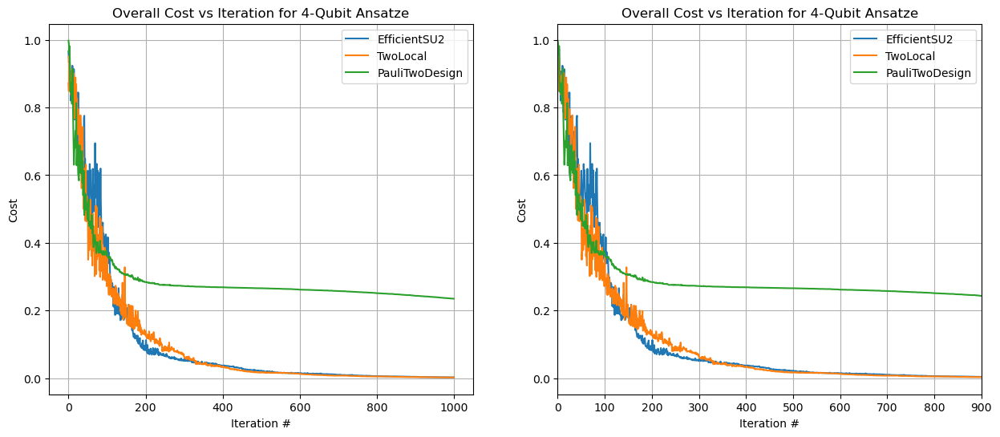

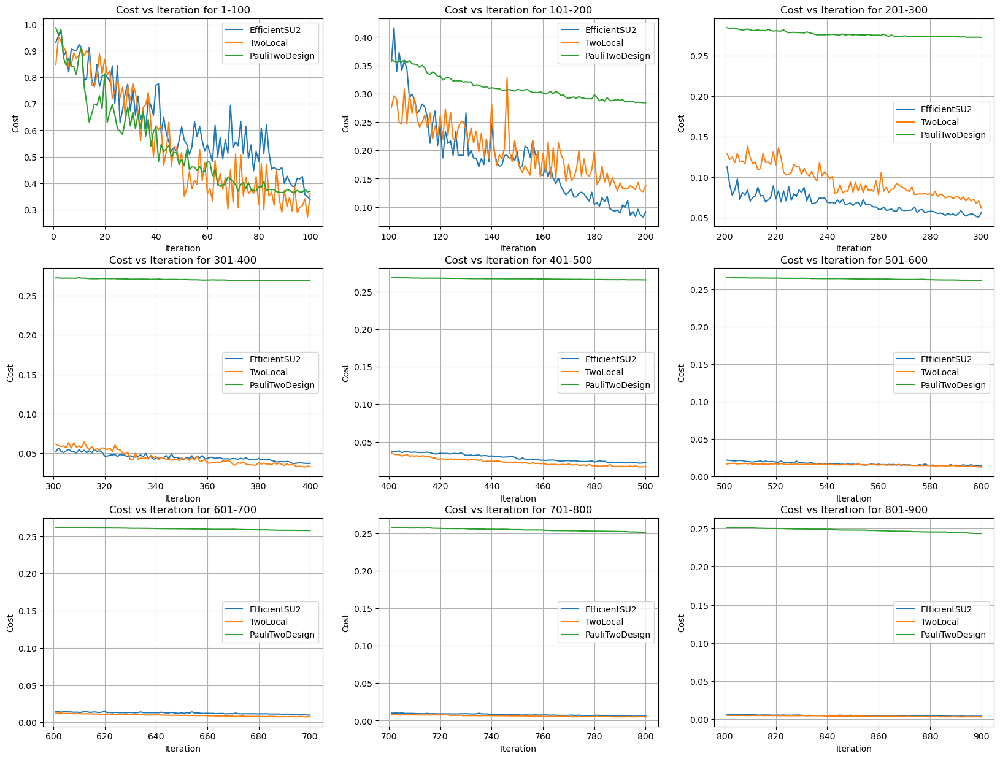

In [281]:
costs_dict_4qub = {
    'EfficientSU2': ESU2_costs1,
    'TwoLocal': TwoLocal_costs1,
    'PauliTwoDesign': PauliTwo4_costs1
}
generate_combined_graph(costs_dict_4qub, 9, 900, "Overall Cost vs Iteration for 4-Qubit Ansatze")

Again, just with the EfficientSU2 and TwoLocal Ansatze now:

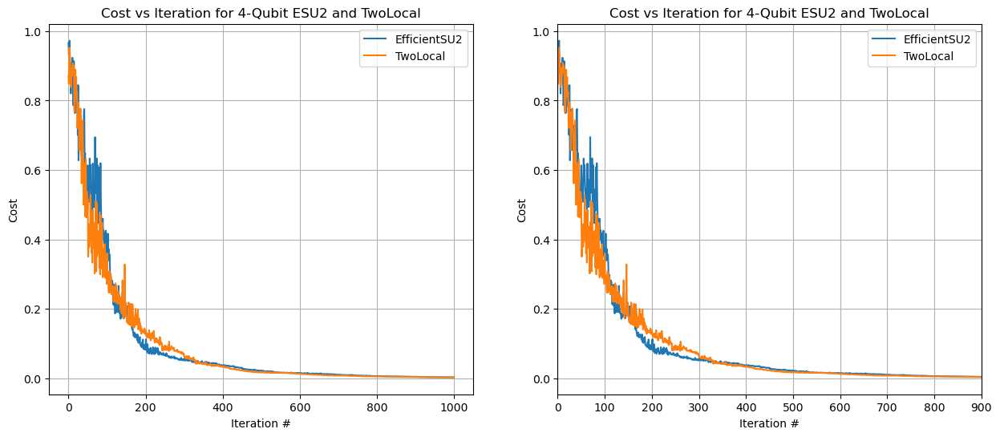

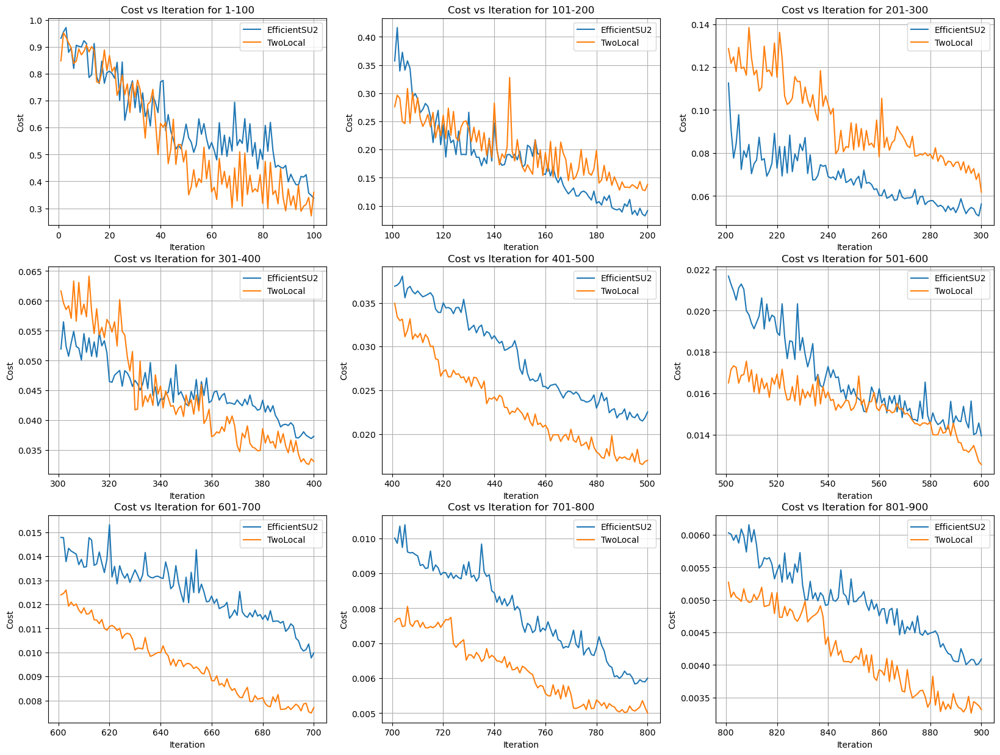

In [282]:
et_costs_dict_4qub = {
    'EfficientSU2': ESU2_costs1,
    'TwoLocal': TwoLocal_costs1
}
generate_combined_graph(et_costs_dict_4qub, 9, 900, "Cost vs Iteration for 4-Qubit ESU2 and TwoLocal")

# Real Coefficients

So far, by using unitary_group and random_statevector, the coefficients in our A, b, and, subsequently, x, have all been complex, generally. Another type of ansatz we can test is with real_amplitudes. Let's first see what happens when we try to optimize it with the previous rv and b_state, which have complex values.

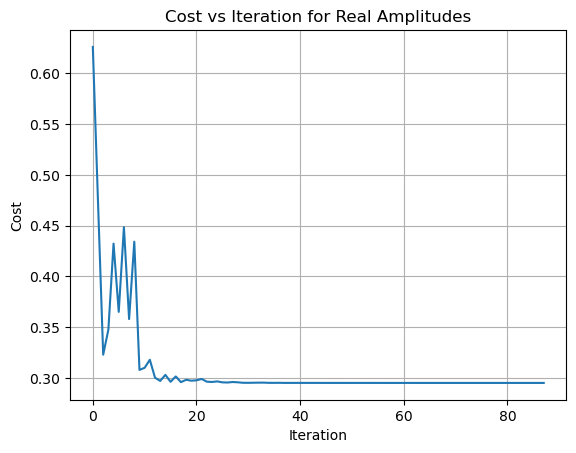

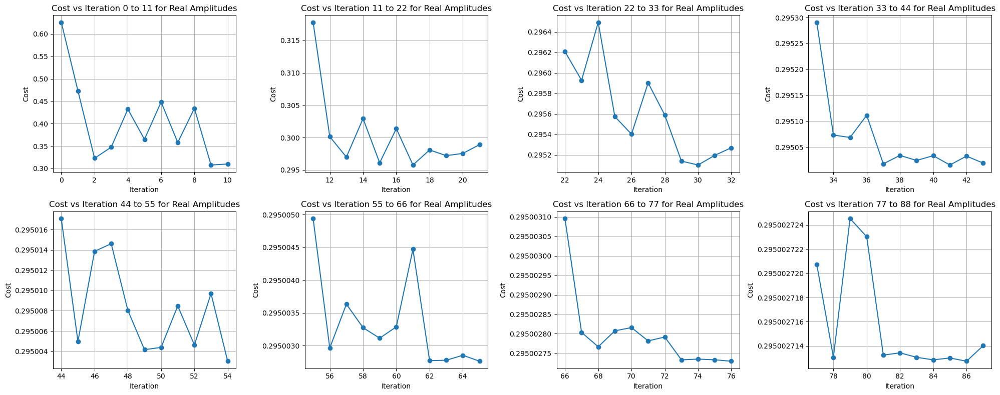

In [245]:
ansatzreal = real_amplitudes(2, reps=2, entanglement='linear')
costsreal1 = minimize_cost(ansatzreal, b_state, rv, cost_func, 1000)
generate_graph(costsreal1, 'Real Amplitudes')

Note how the cost stays relatively high, and the algorithm converges when the fidelity is nowhere near 1.0, even without introduced noise. For it to be effective, we will use ortho_group for a random orthgonal matrix so that all of the relevant coefficients are real, and not complex.

To get our final b vector that is guaranteed to work, we generate an x vector with all real coefficients, then normalize it. The b vector is simply Ax.

In [ ]:
def normalize(vec): #normalizes a vector so the norm of the returned vec = 1
    norm = np.linalg.norm(vec)
    if norm == 0:
        return vec
    return vec / norm

In [ ]:
ortho = ortho_group.rvs(dim=4) #orthogonal matrices as the real analog to unitary ones
vect = [random.uniform(-10, 10) for i in range(0, 4)] # start with arbitrary vec with only real values, and normalize it
normvect = normalize(vect)
b_real = np.matmul(ortho, normvect)
b_real_state = Statevector(b_real) #b is now a vector in R and the system is still solvable

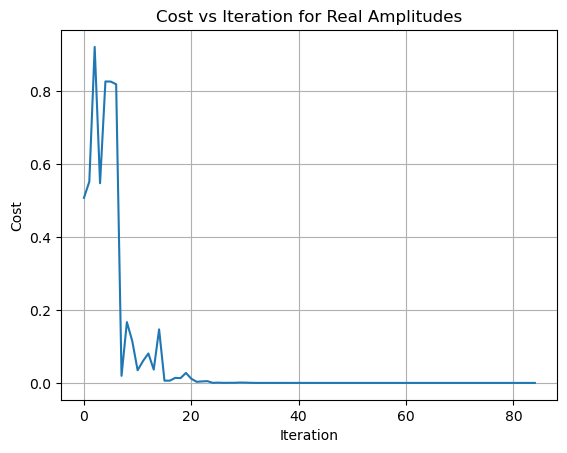

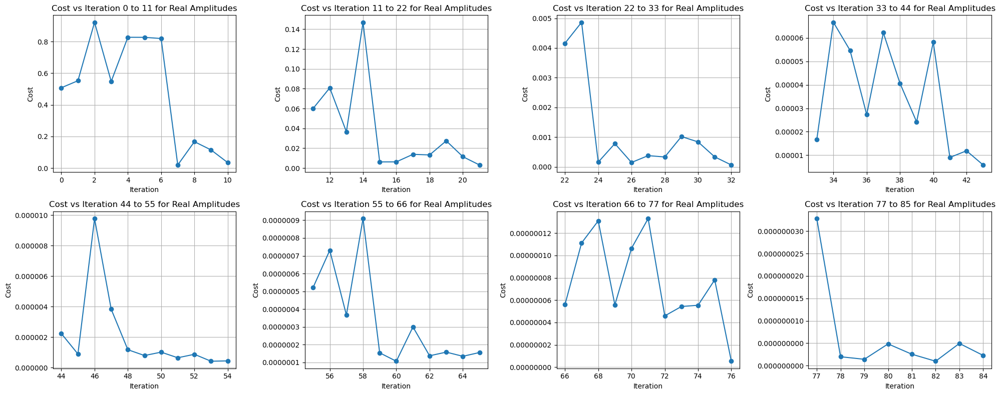

In [247]:
ansatzreal = real_amplitudes(2, reps=2, entanglement='linear')
costsreal2 = minimize_cost(ansatzreal, b_real_state, ortho, cost_func, 1000)
generate_graph(costsreal2, 'Real Amplitudes')

From henceforth in this notebook, whenever we run a trial with RealAmplitudes, it will be done with an orthogonal matrix as the operator rather than an arbitrary unitary, with the b and x vectors also only having real components. This can help give us a better benchmark on how this ansatz performs with how it was designed to -- with real coefficients. Still, due to other ansatze's capabilities of reaching high fidelities even with complex coefficients, RealAmplitudes can not be counted as outright superior. However, we can examine how RealAmplitudes compares with the other three ansatze tested earlier on systems with only real coefficients.

In [248]:
ansatz1 = EfficientSU2(2, reps=2, entanglement='linear')
ESU2_costs_real = minimize_cost(ansatz1, b_real_state, ortho, cost_func, 1000)
ansatz2 = TwoLocal(num_qubits=2, rotation_blocks=['rx', 'rz'], entanglement_blocks='cx', entanglement='linear', reps=2)
TwoLocal_costs_real = minimize_cost(ansatz2, b_real_state, ortho, cost_func, 1000)
ansatz3 = PauliTwoDesign(num_qubits=2, reps=2)
PauliTwo2_costs_real = minimize_cost(ansatz3, b_real_state, ortho, cost_func, 1000)

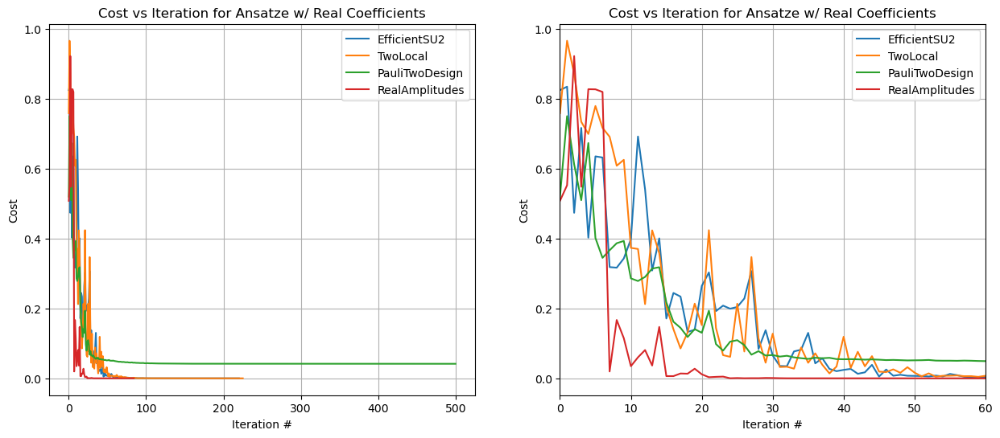

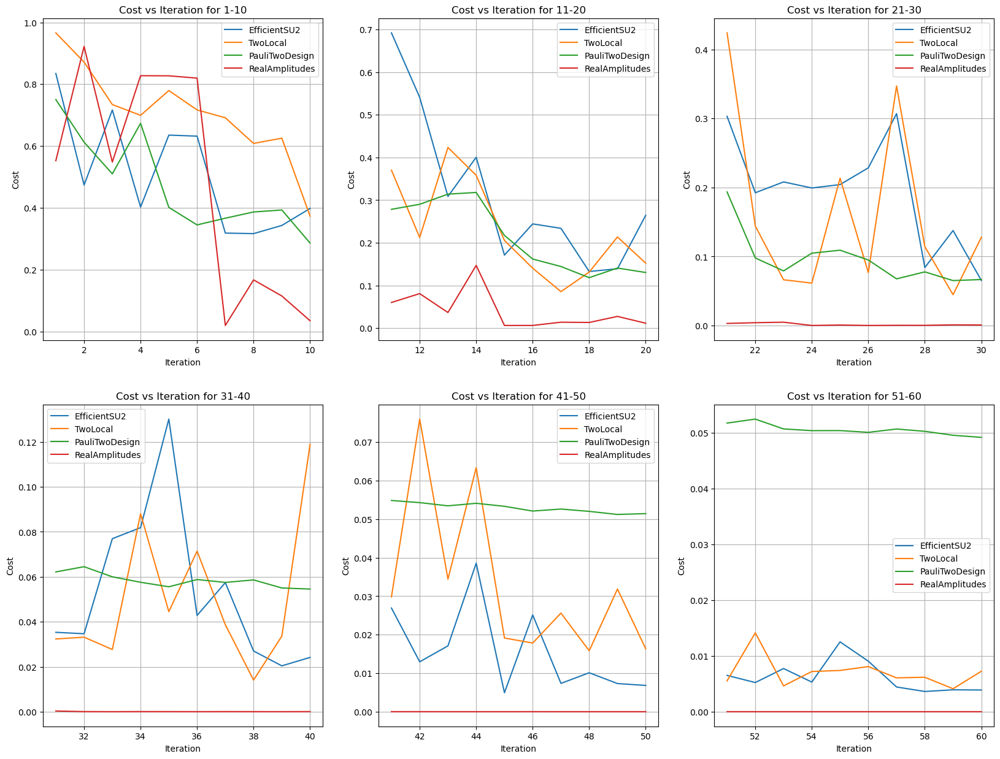

In [283]:
costs_dict_2qub_real = {
    'EfficientSU2': ESU2_costs_real,
    'TwoLocal': TwoLocal_costs_real,
    'PauliTwoDesign': PauliTwo2_costs_real,
    'RealAmplitudes': costsreal2
}
generate_combined_graph(costs_dict_2qub_real, 6, 60, "Cost vs Iteration for Ansatze w/ Real Coefficients")

# Analysis with Circuit Depth

## Drawing the circuits

We first examine the circuits by drawing them, and looking at how the number of parameters in each scale with qubit count and the number of reps.

### EfficientSU2

EfficientSU2 with 2 qubits and 2 reps has 12 parameters


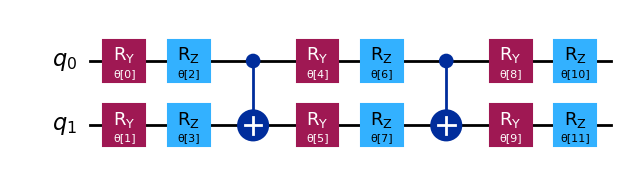

In [258]:
ansatz = EfficientSU2(2, reps=2, entanglement='linear')
print("EfficientSU2 with 2 qubits and 2 reps has " + str(ansatz.num_parameters) + " parameters")
ansatz.decompose().draw('mpl')

EfficientSU2 with 4 qubits and 4 reps has 40 parameters with a depth of 1


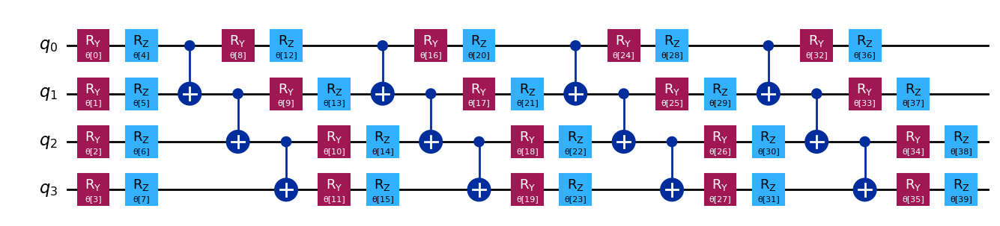

In [ ]:
ansatz = EfficientSU2(4, reps=4, entanglement='linear')
print("EfficientSU2 with 4 qubits and 4 reps has " + str(ansatz.num_parameters) + " parameters")
ansatz.decompose().draw('mpl')

We can define the number of qubits as q, the number of reps as n, and the number of parameters as p to see that for the EfficientSU2,
$$
p= 2q(n+1)
$$

### TwoLocal

TwoLocal with 2 qubits and 2 reps has 12 parameters


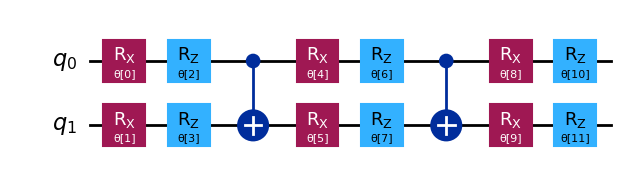

In [119]:
ansatz = TwoLocal(num_qubits=2, rotation_blocks=['rx', 'rz'], entanglement_blocks='cx', entanglement='linear', reps=2)
print("TwoLocal with 2 qubits and 2 reps has " + str(ansatz.num_parameters) + " parameters")
ansatz.decompose().draw('mpl')

TwoLocal with 4 qubits and 4 reps has 40 parameters


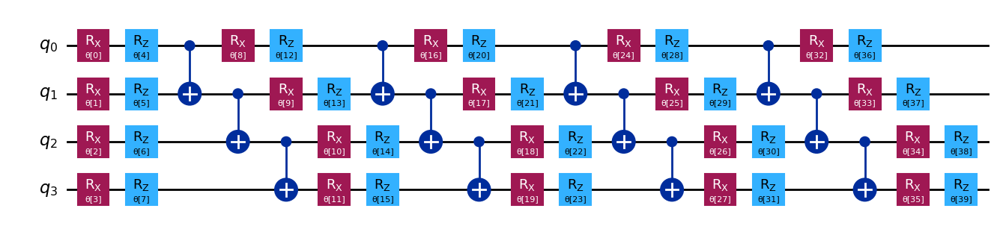

In [125]:
ansatz = TwoLocal(num_qubits=4, rotation_blocks=['rx', 'rz'], entanglement_blocks='cx', entanglement='linear', reps=4)
print("TwoLocal with 4 qubits and 4 reps has " + str(ansatz.num_parameters) + " parameters")
ansatz.decompose().draw('mpl')

We can define the number of qubits as q, the number of reps as n, and the number of parameters as p to see that for the TwoLocal,
$$ 
p= 2q(n+1)
$$

### PauliTwoDesign

PauliTwo with 2 qubits and 2 reps has 6 parameters


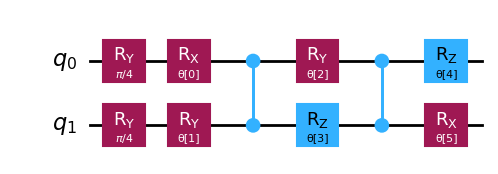

In [121]:
ansatz = PauliTwoDesign(num_qubits=2, reps=2)
print("PauliTwo with 2 qubits and 2 reps has " + str(ansatz.num_parameters) + " parameters")
ansatz.decompose().draw('mpl')

PauliTwo with 4 qubits and 4 reps has 20 parameters


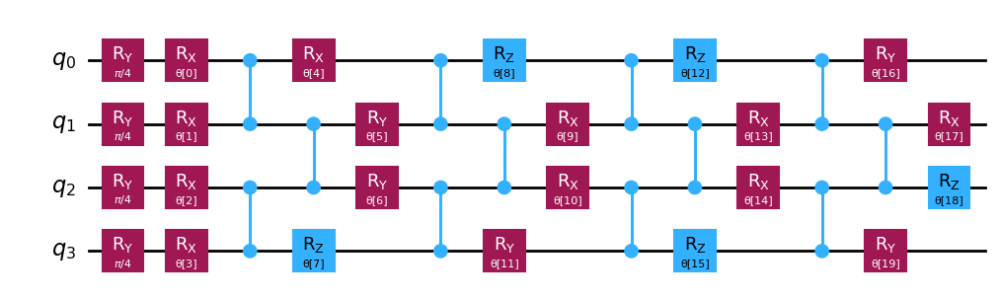

In [122]:
ansatz = PauliTwoDesign(num_qubits=4, reps=4)
print("PauliTwo with 4 qubits and 4 reps has " + str(ansatz.num_parameters) + " parameters")
ansatz.decompose().draw('mpl')

We can define the number of qubits as q, the number of reps as n, and the number of parameters as p to see that for the PauliTwoDesign,
$$
p= q(n+1)
$$

### RealAmplitudes

Real Amplitudes with 2 qubits and 2 reps has 6 parameters


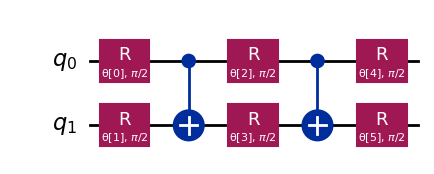

In [127]:
ansatz = real_amplitudes(2, reps=2, entanglement='linear')
print("Real Amplitudes with 2 qubits and 2 reps has " + str(ansatz.num_parameters) + " parameters")
ansatz.decompose().draw('mpl')

Real Amplitudes with 4 qubits and 4 reps has 20 parameters


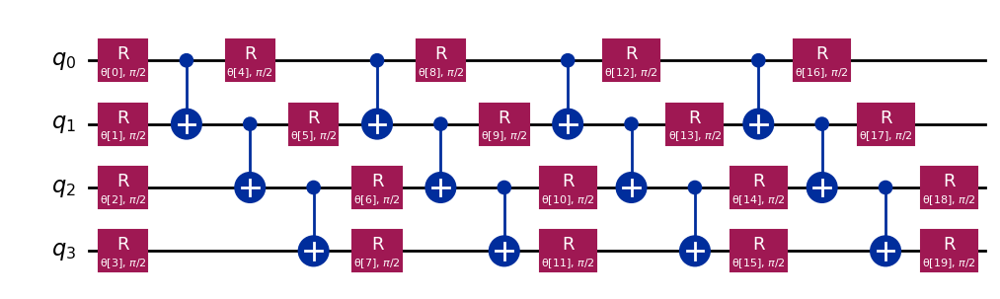

In [128]:
ansatz = real_amplitudes(4, reps=4, entanglement='linear')
print("Real Amplitudes with 4 qubits and 4 reps has " + str(ansatz.num_parameters) + " parameters")
ansatz.decompose().draw('mpl')

We can define the number of qubits as q, the number of reps as n, and the number of parameters as p to see that for the RealAmplitudes,
$$
p= q(n+1)
$$

## Running the VQLS for different reps

We now examine how the ansatze perform when changing the amount of reps tken, ranging from 1 to 8 reps. We can start with our familiar old 2-qubit system.

### 2 Qubits

In [259]:
esu2_costs_dict = {}
for i in range (1,9):
    ansatz = EfficientSU2(2, reps=i, entanglement='linear')
    costs = minimize_cost(ansatz, b_state, rv, cost_func, 1000)
    esu2_costs_dict[str(i)+' reps with EfficientSU2'] = costs

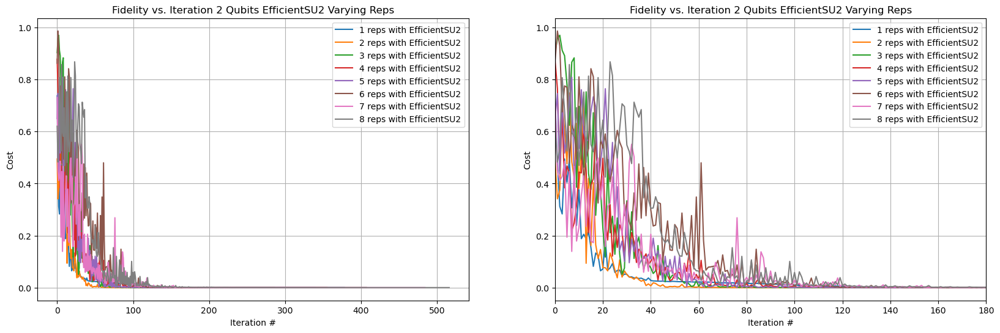

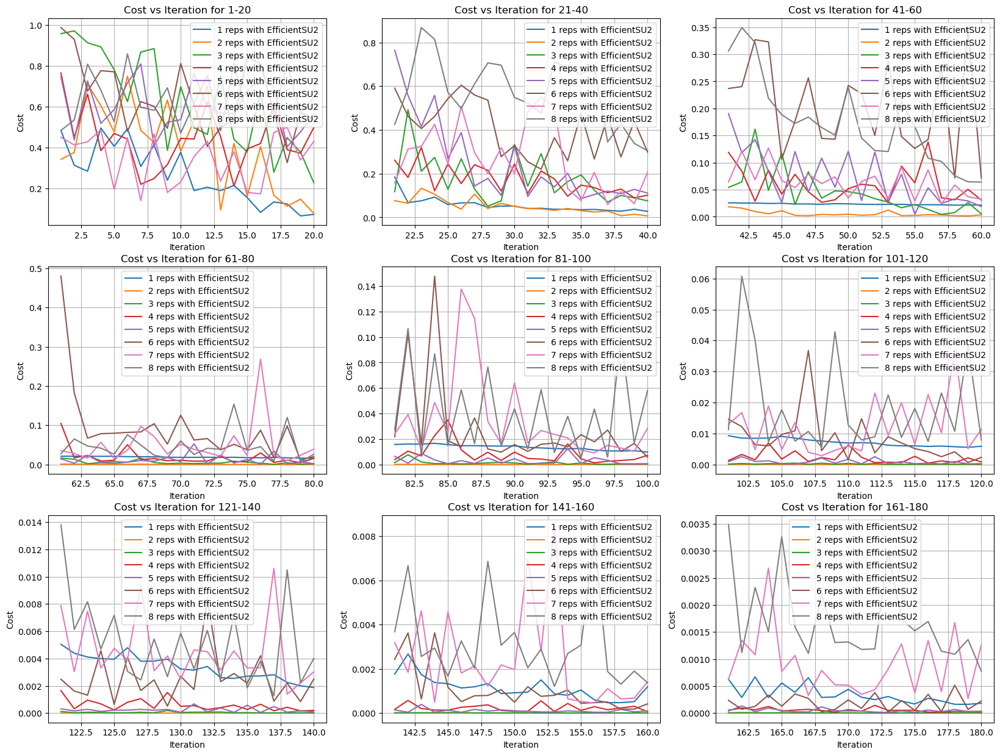

In [306]:
generate_combined_graph(esu2_costs_dict, 9,180, "Fidelity vs. Iteration 2 Qubits EfficientSU2 Varying Reps")

In [260]:
tl_costs_dict = {}
for i in range (1,9):
    ansatz = TwoLocal(num_qubits=2, rotation_blocks=['rx', 'rz'], entanglement_blocks='cx', entanglement='linear', reps=i)
    costs = minimize_cost(ansatz, b_state, rv, cost_func, 1000)
    tl_costs_dict[str(i)+' reps with TwoLocal'] = costs

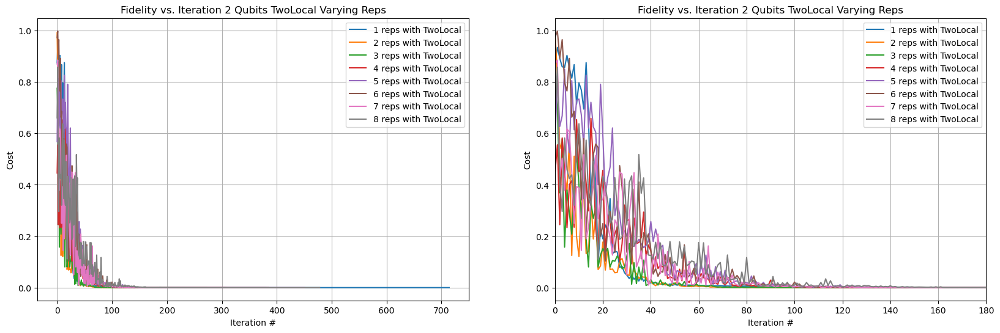

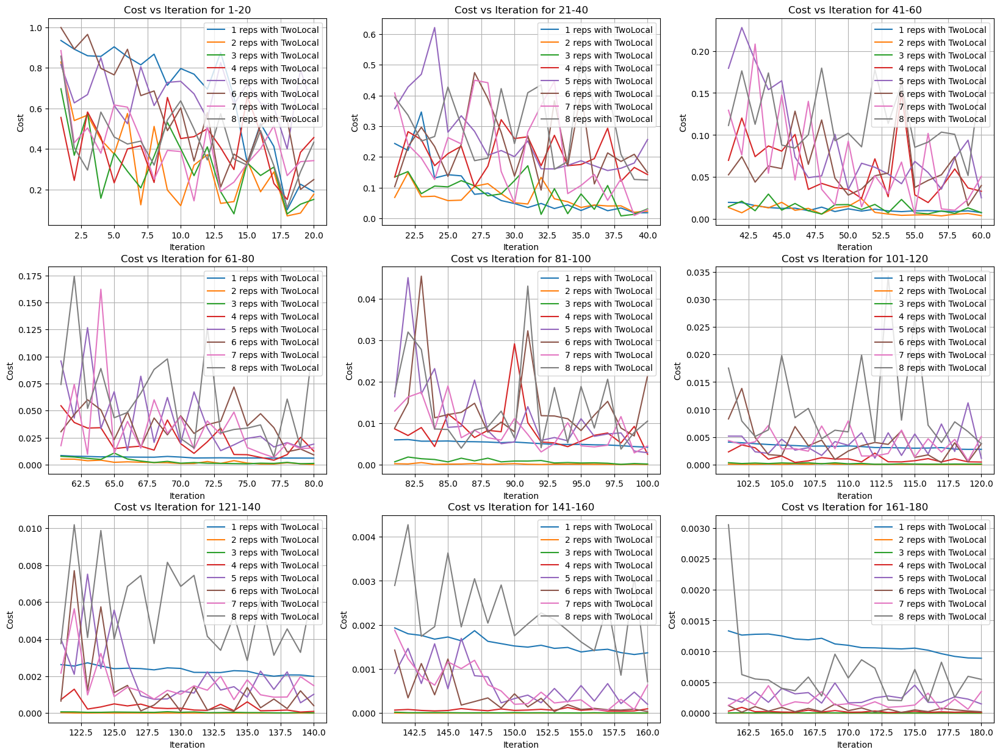

In [307]:
generate_combined_graph(tl_costs_dict, 9,180, "Fidelity vs. Iteration 2 Qubits TwoLocal Varying Reps")

In [288]:
ptd_costs_dict = {}
for i in range (1,9):
    ansatz = PauliTwoDesign(num_qubits=2, reps=i)
    costs = minimize_cost(ansatz, b_state, rv, cost_func, 1000)
    ptd_costs_dict[str(i)+' reps with PauliTwoDesign'] = costs

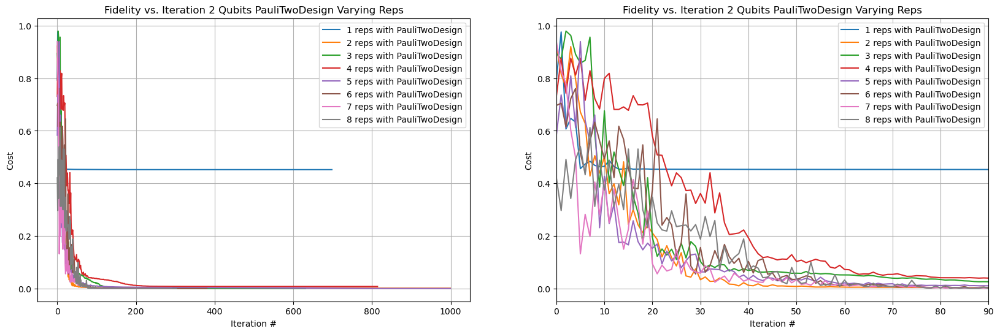

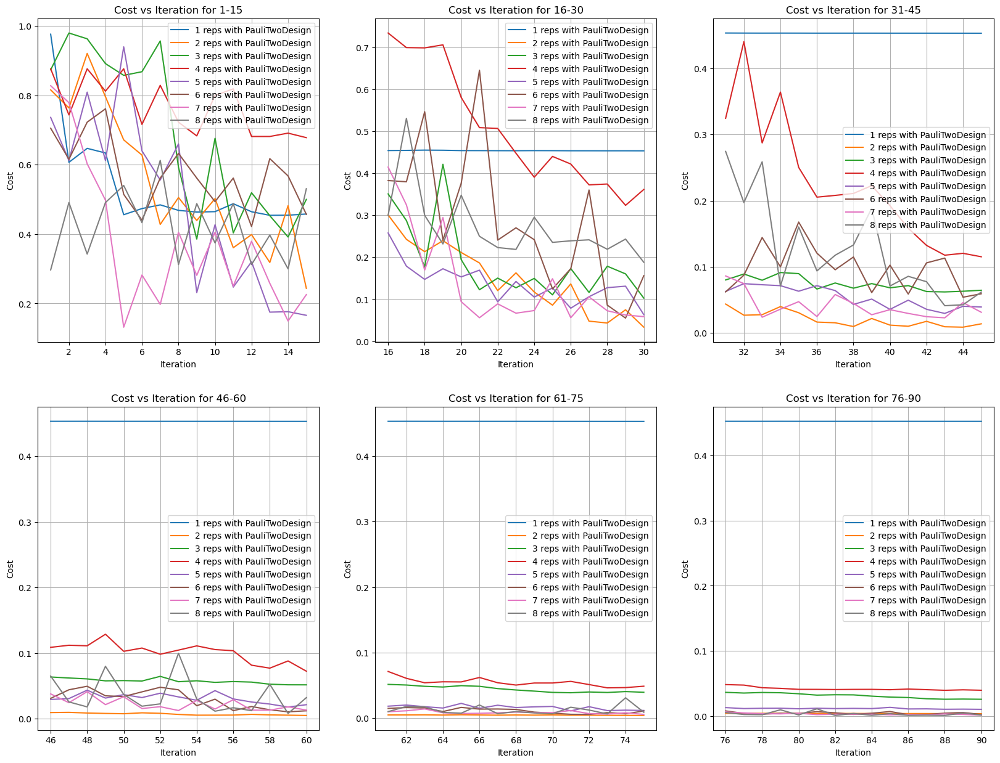

In [308]:
generate_combined_graph(ptd_costs_dict, 6,90, "Fidelity vs. Iteration 2 Qubits PauliTwoDesign Varying Reps")

In [299]:
ra_costs_dict = {}
for i in range (1,9):
    ansatz = real_amplitudes(2, reps=i, entanglement='linear')
    costs = minimize_cost(ansatz, b_real_state, ortho, cost_func, 1000)
    ra_costs_dict[str(i)+' reps with RealAmplitudes'] = costs

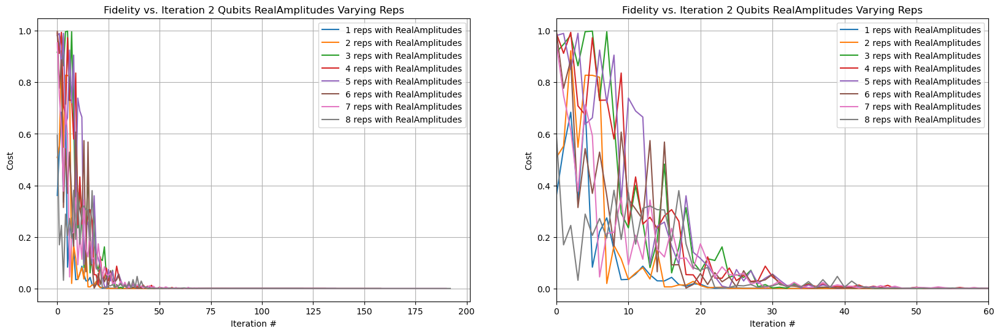

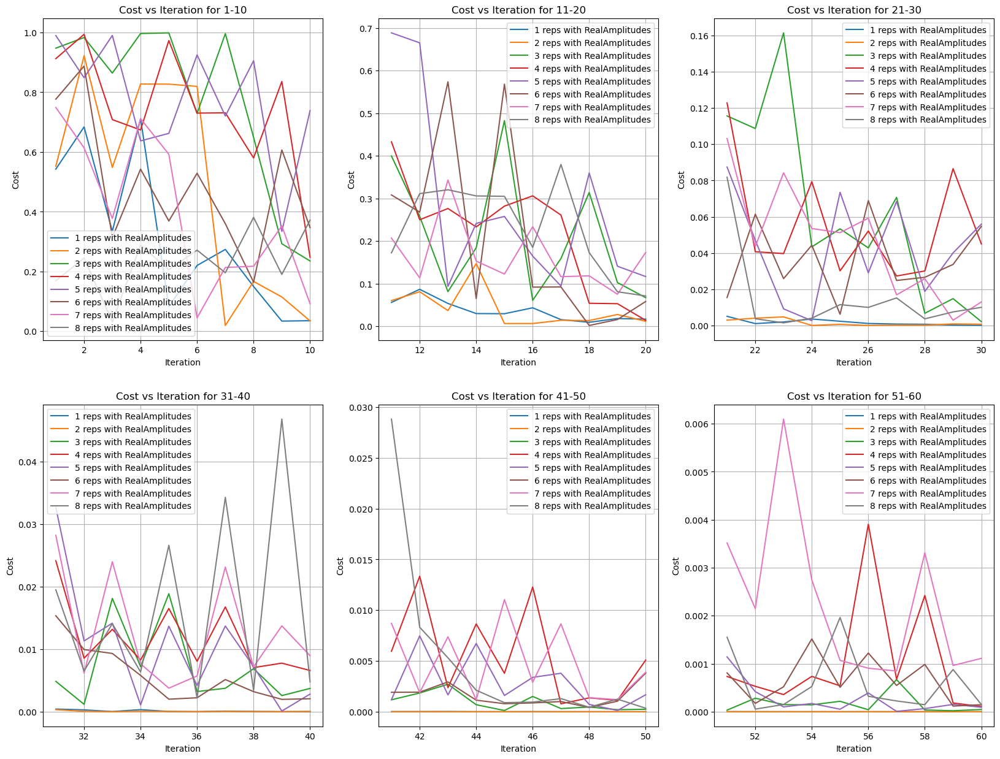

In [309]:
generate_combined_graph(ra_costs_dict, 6,60, "Fidelity vs. Iteration 2 Qubits RealAmplitudes Varying Reps")

### 4 Qubits

We run essentially the same trials as above, but also scaling the number of qubits as well.

In [300]:
esu2_costs_dict1 = {}
for i in range (1,9):
    ansatz = EfficientSU2(4, reps=i, entanglement='linear')
    costs = minimize_cost(ansatz, b1_state, op, cost_func, 1000)
    esu2_costs_dict1[str(i)+' reps with EfficientSU2 with 4 qubits'] = costs

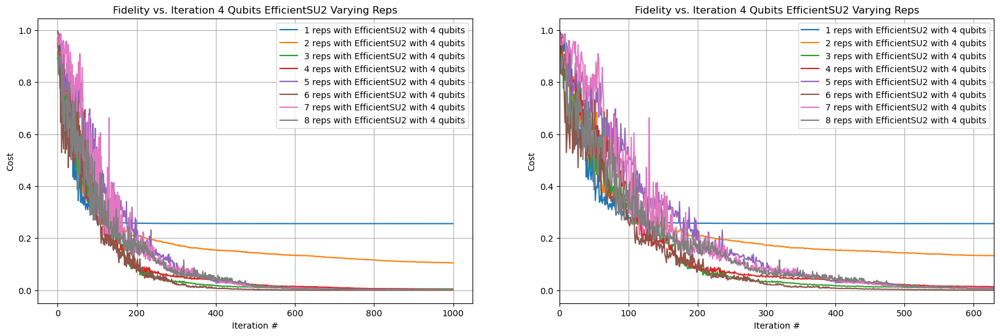

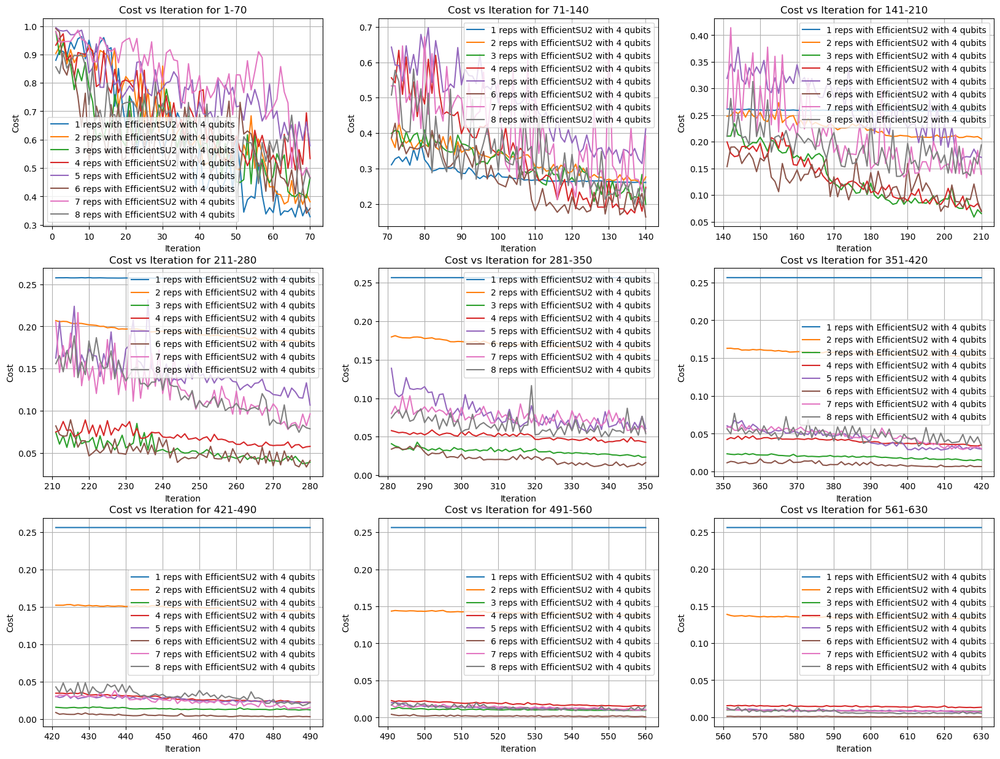

In [310]:
generate_combined_graph(esu2_costs_dict1, 9,630, "Fidelity vs. Iteration 4 Qubits EfficientSU2 Varying Reps")

In [301]:
tl_costs_dict1 = {}
for i in range (1,9):
    ansatz = TwoLocal(num_qubits=4, rotation_blocks=['rx', 'rz'], entanglement_blocks='cx', entanglement='linear', reps=i)
    costs = minimize_cost(ansatz, b1_state, op, cost_func, 1000)
    tl_costs_dict1[str(i)+' reps with TwoLocal with 4 qubits'] = costs

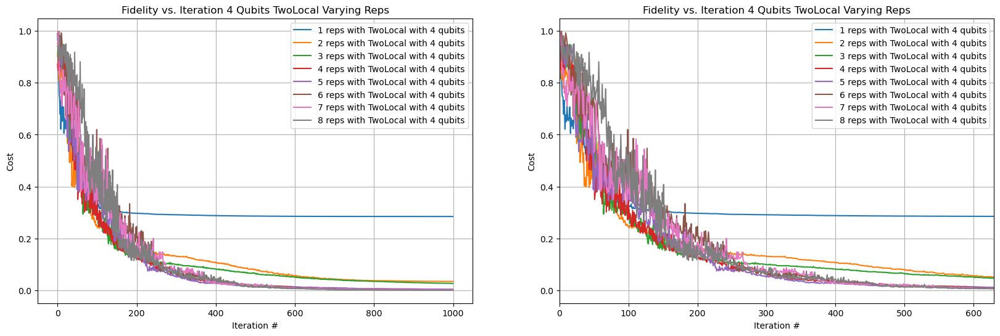

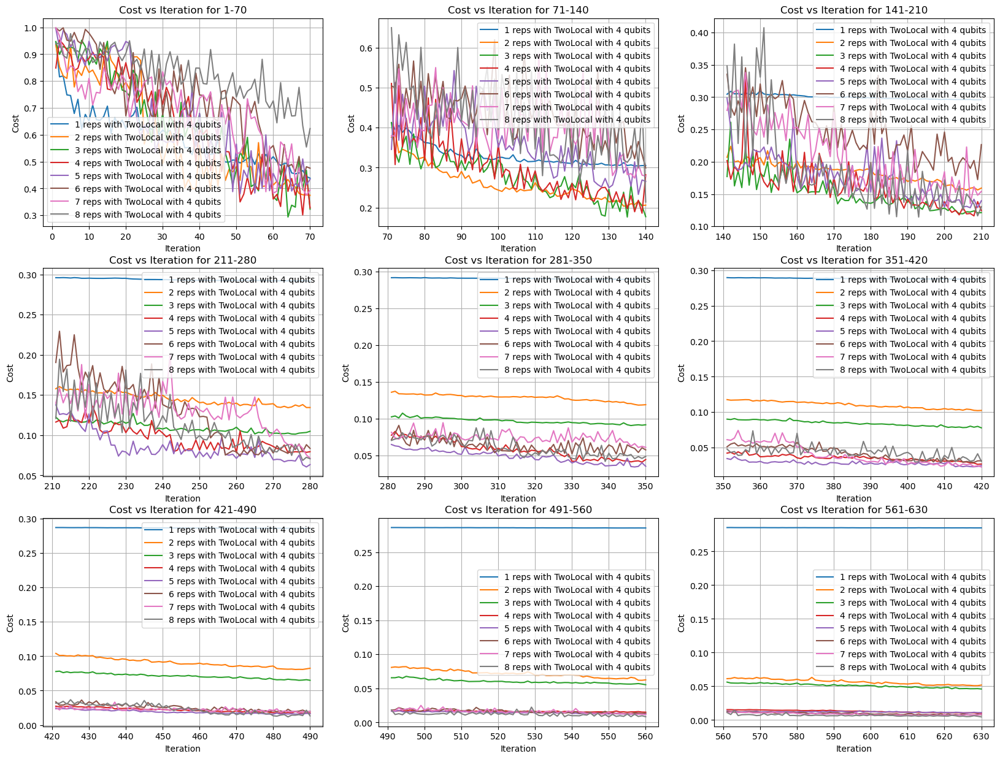

In [311]:
generate_combined_graph(tl_costs_dict1, 9,630, "Fidelity vs. Iteration 4 Qubits TwoLocal Varying Reps")

In [314]:
ptd_costs_dict1 = {}
for i in range (1,9):
    ansatz = PauliTwoDesign(num_qubits=4, reps=i)
    costs = minimize_cost(ansatz, b1_state, op, cost_func, 1000)
    ptd_costs_dict1[str(i)+' reps with PauliTwoDesign with 4 qubits'] = costs

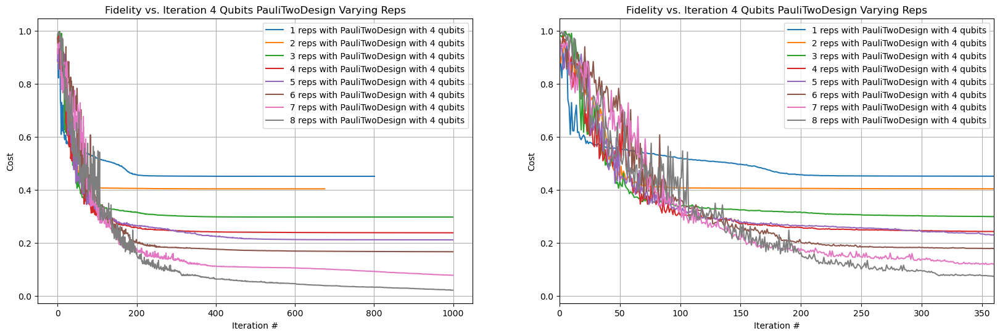

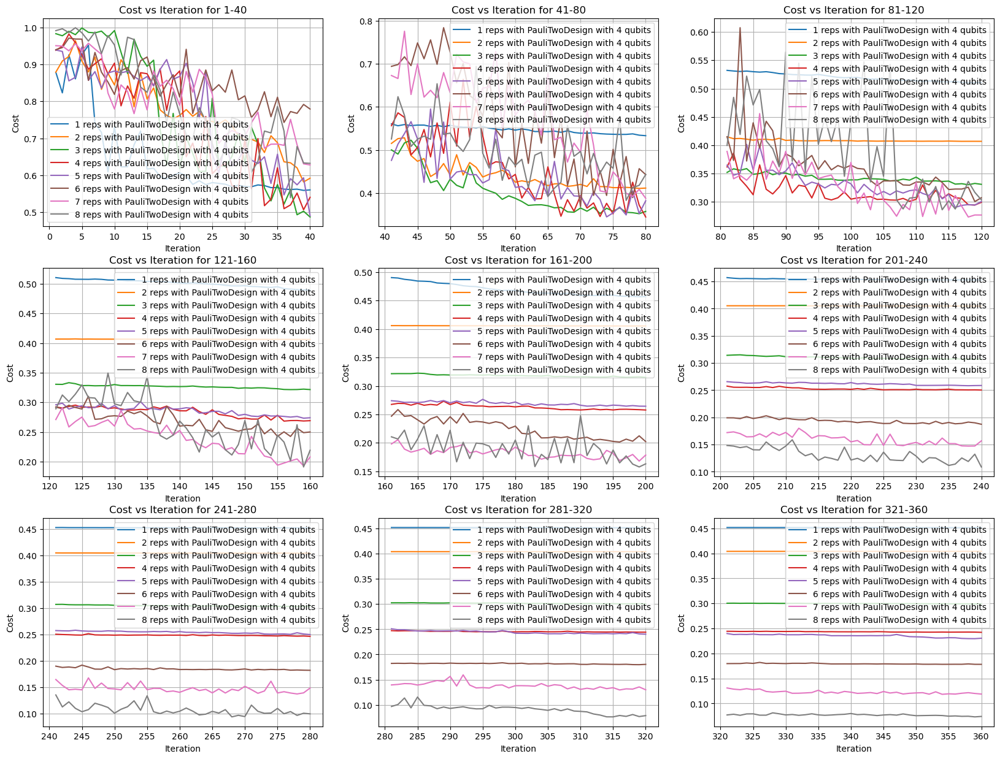

In [315]:
generate_combined_graph(ptd_costs_dict1, 9,360, "Fidelity vs. Iteration 4 Qubits PauliTwoDesign Varying Reps")

We define operator A and vector b as before in our initial running of RealAmplitudes, but for a 4-qubit ansatz (matrices, vectors are of dimension 16).

In [157]:
ortho4 = ortho_group.rvs(dim=16)
vect = [random.uniform(-10, 10) for i in range(0, 16)]
normvect = normalize(vect)
b_real4 = np.matmul(ortho4, normvect)
b_real_state4 = Statevector(b_real4) 

In [303]:
ra_costs_dict1 = {}
for i in range (1,9):
    ansatz = real_amplitudes(4, reps=i, entanglement='linear')
    costs = minimize_cost(ansatz, b_real_state4, ortho4, cost_func, 1000)
    ra_costs_dict1[str(i)+' reps with RealAmplitudes with 4 qubits'] = costs

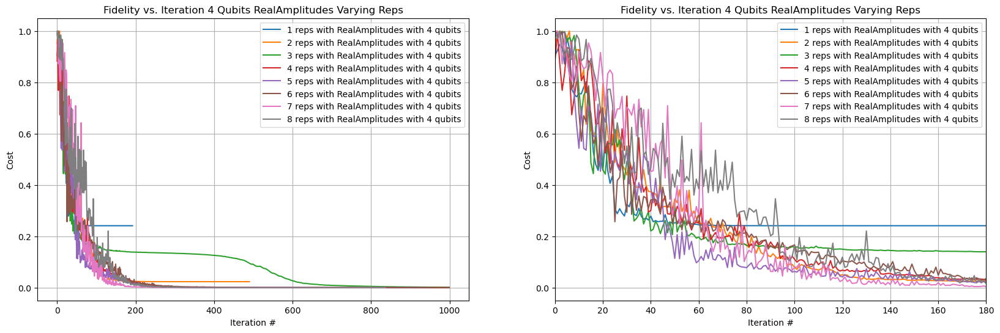

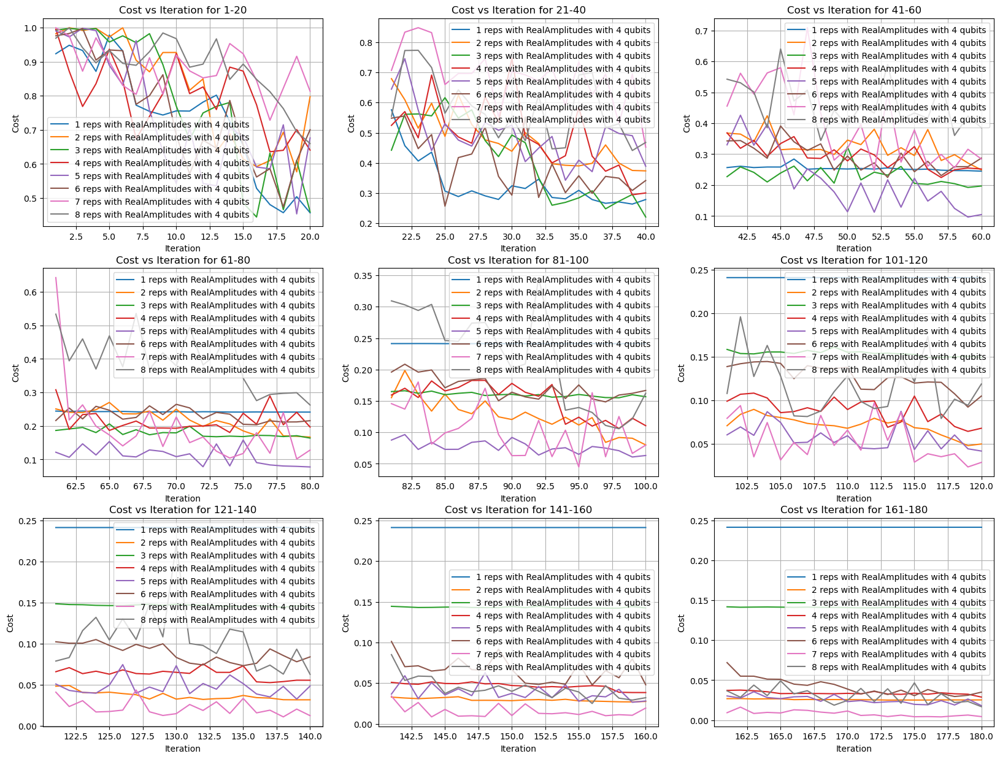

In [313]:
generate_combined_graph(ra_costs_dict1, 9,180, "Fidelity vs. Iteration 4 Qubits RealAmplitudes Varying Reps")

### Comparison among ansatz

We just consider the TwoLocal and EfficientSU2 ansatze for now, which had the best fidelities while working for systems with complex coefficients. We compare the two ansatze's performance for the previously define 4-qubit system and reps of (2,4,6,8).

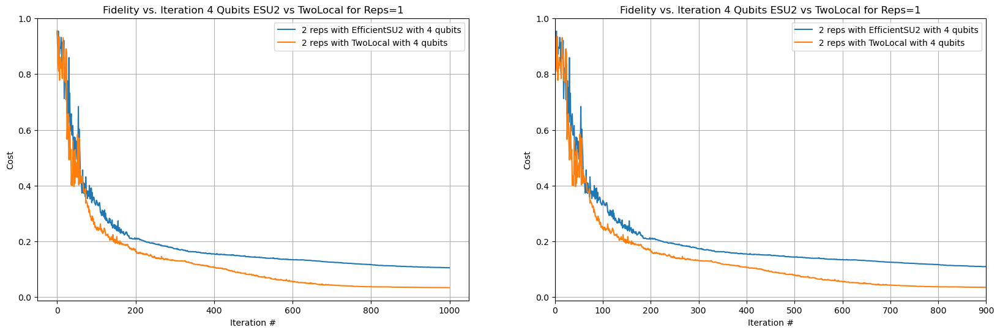

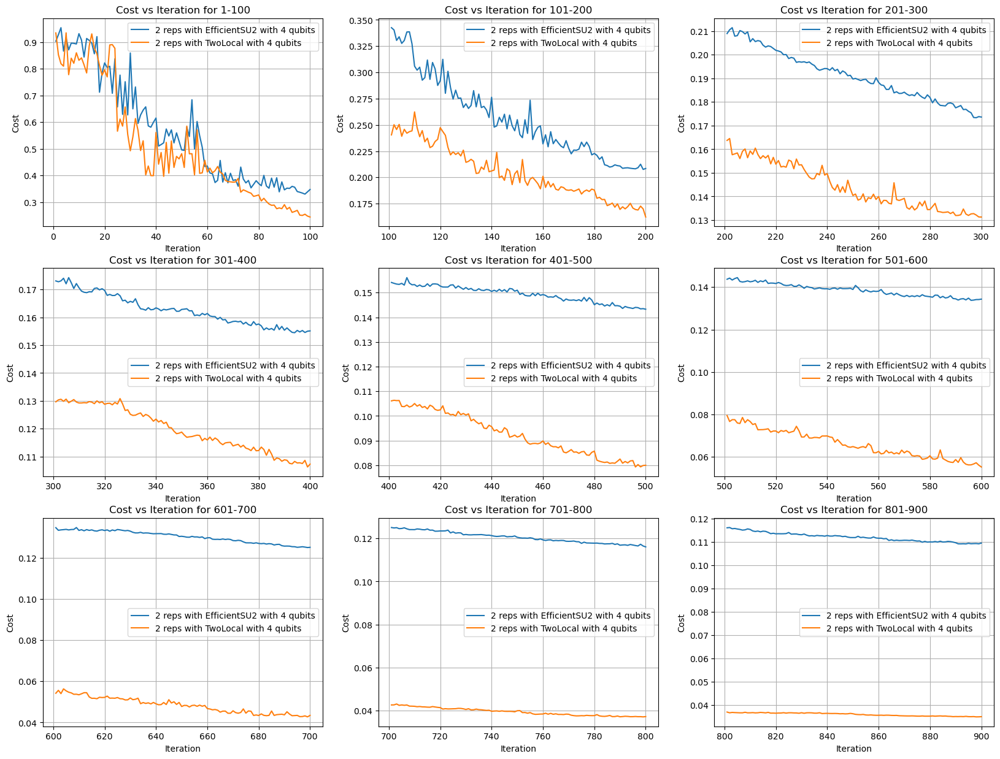

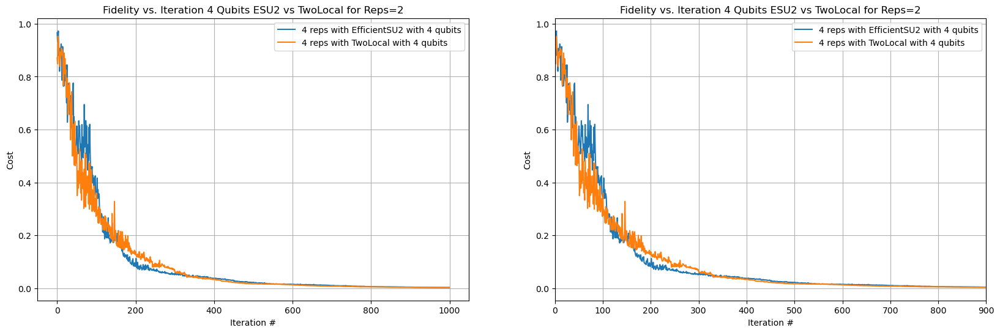

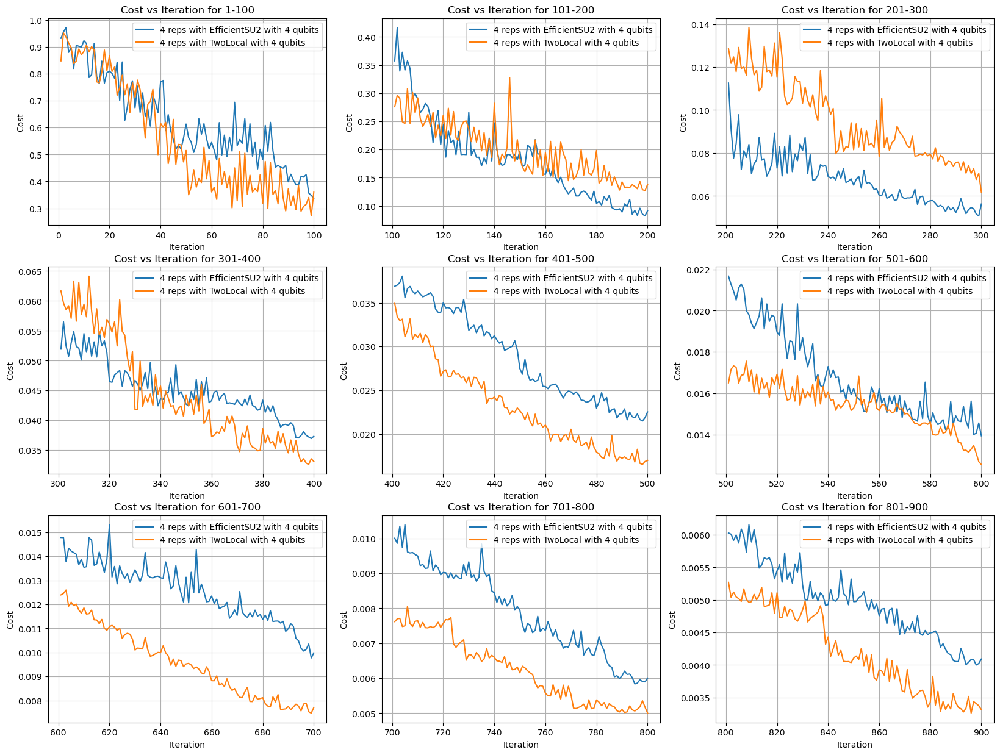

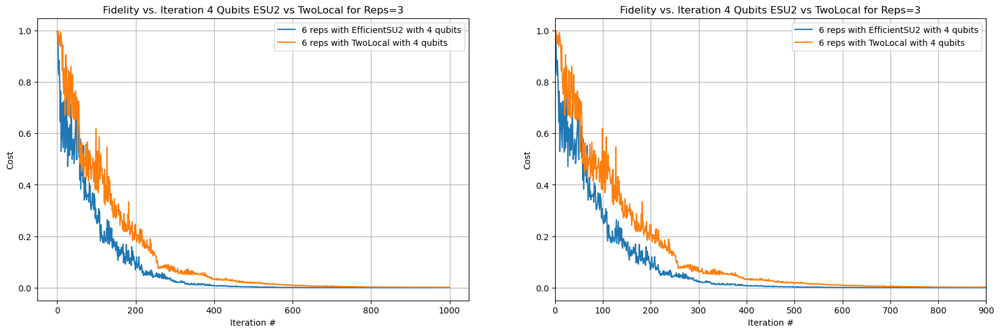

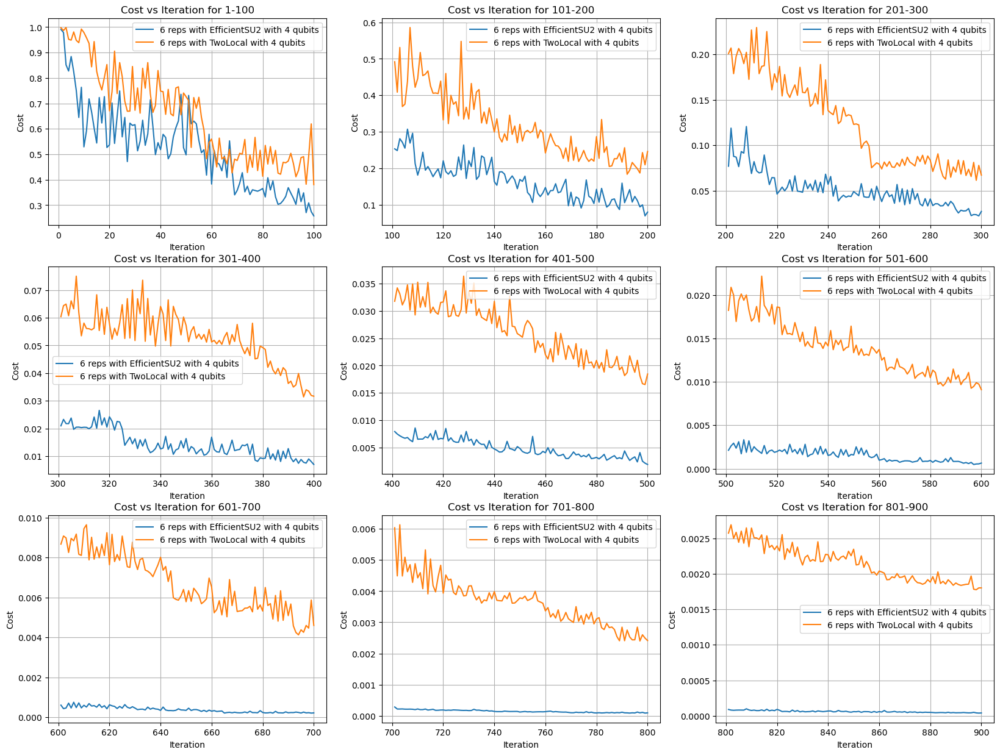

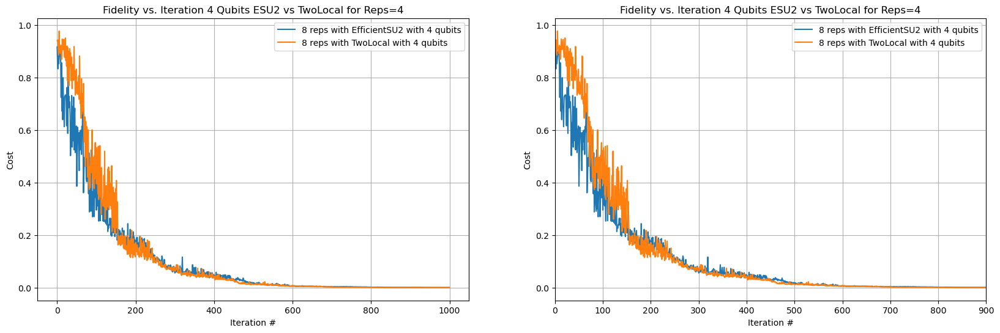

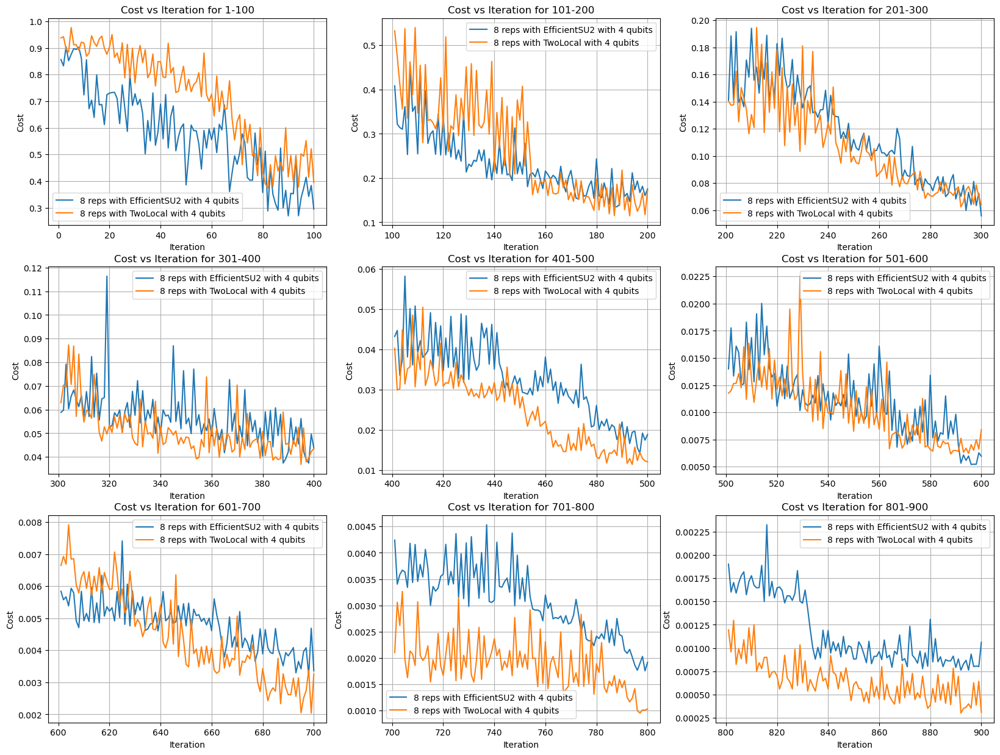

In [319]:
esu2_tl_dicts = []
for i in range (1,5):
    temp_dict = {str(2*i)+' reps with EfficientSU2 with 4 qubits': esu2_costs_dict1[str(2*i)+' reps with EfficientSU2 with 4 qubits'], str(2*i)+' reps with TwoLocal with 4 qubits': tl_costs_dict1[str(2*i)+' reps with TwoLocal with 4 qubits']}
    generate_combined_graph(temp_dict, 9,900, "Fidelity vs. Iteration 4 Qubits ESU2 vs TwoLocal for Reps=" + str(i))


# For more general systems

So far, we've been modeling linear systems with quantum circuits under the assumption that for Ax=b, A is unitary, and x and b are quantum states (i.e., the sum of the squares of the components=1). In this section, we examine how we can still apply the VQLS algorithm to more general linear systems.

## For general vectors rather than just statevectors

Say that we actually want to solve some arbitrary system Ax=b, not just those that have x and b as quantum states. For general vectors x and b, we can simply normalize them when needed.

In [ ]:
ug = unitary_group.rvs(dim=4)
vect = [complex(random.uniform(-10, 10), random.uniform(-10,10)) for i in range(0, 4)] #this vector is not a quantum state
b_gen = np.matmul(ug, vect) #find a b vector that can actually be reached by Ax(theta), so the system is solvable
b_gen_state = Statevector(b_gen) #statevector of the array for b
print(b_gen_state)

Statevector([-4.09997908+7.68946457j, -4.42321768+4.38949099j,
             -8.51654429+0.53811013j,  2.29944011+6.1054209j ],
            dims=(2, 2))


We (arbitrarily) test just with EfficientSU2, with 2 qubits.

In [ ]:
ansatz = EfficientSU2(2, reps=2, entanglement='linear')
result = minimize(cost_func, x0 = np.ones(ansatz.num_parameters), args=(ansatz, normalize(b_gen_state), ug, [], False), method='COBYLA', options={'maxiter': 1000}) 
#we pass in the normalized version of b_gen_state instead of just the statevector before normalization

In [322]:
params_final = result['x'][0:ansatz.num_parameters] #extract the final parameters for our ansatze that minimizes the cost function                          


#getting final state to check fidelity between Ax(theta_final) and b
check_ansatz = ansatz.assign_parameters(params_final)
check_ansatz.save_statevector()
backend = Aer.get_backend('aer_simulator')
transpiled_ansatz = transpile(check_ansatz, backend)
Result = backend.run(transpiled_ansatz, shots=1).result()
final_state = Result.get_statevector(transpiled_ansatz, decimals=10) #this is the state x(theta)
print("fidelity:", state_fidelity(final_state, normalize(Statevector(vect)))) # vect was our "x" vector, so instead of Ax(theta) and b, we can also use x(theta) and vect

fidelity: 0.999999995912342


## For operators not of dimension $2^n$ by $2^n$

Recall that for an n-qubit quantum circuit, the operator associated must be of dimension $2^n$ by $2^n$. Naturally, we must acknowledge that not all linear systems of interest are of such dimensions. To resolve this, we expand the given A matrix and b vector to be dimension $2^x>n$, where n was their original size. For the new coefficients introduced, we fill the new diagonal components with 1 and everything else with 0. It is important to note that doing so for the operator A retains orthogonality or being unitary. For expanding the vector b, we simply fill the new indices with 1's. At the end, we will obtain a vector, x(theta), with some extranneous components in the indices greater than the original dimension, n. By simply cutting off the extra components and renormalizing it, we will have obtained a vector that is a scalar multiple of the desired x.

In [324]:
# For expanding a matrix to be of dimension 2^x by 2^x
def expand_matrix(matrix):
    matrix = np.array(matrix)
    n = matrix.shape[0] #store dimension

    x = math.ceil(math.log2(n)) #we will expand the matrix to be of dimension 2x now
    new_dim = 2 ** x

    expanded_matrix = np.zeros((new_dim, new_dim), dtype=matrix.dtype) #default have 0's everywhere
    expanded_matrix[:n, :n] = matrix #still keep original components of original matrix in corresponding indices

    for i in range(new_dim-n): #fills the newly introduced diagonal components with 1's
        expanded_matrix[new_dim-i-1, new_dim-i-1] = 1

    return expanded_matrix

In [325]:
# For expanding a matrix to be of dimension dim, which will be some 2^x
def expand_vector(vector, dim):
    vector = np.array(vector)
    extended_vector = np.ones(dim, dtype=vector.dtype) #new indices will be filled with ones
    extended_vector[:len(vector)] = vector
    return extended_vector

In [326]:
# Cuts the vector back down to its original size, to be specified by dim
def cut_vector(vector, dim):
    vector = np.array(vector)
    return vector[:dim]

As an example this time, we use all real coefficients and RealAmplitudes for simplicity.

In [329]:
orth = ortho_group.rvs(dim=3) #this is A, now an operator that is 3 by 3
original_dim = orth.shape[0] #store the original dimension

temp_vect = [random.uniform(-10, 10) for i in range(0, 3)]
norm_temp_vect = normalize(temp_vect) #we get the true x vector to ensure the system is solvable. If it weren't normalized here, we could apply the same procedure are done earlier to still resolve the system

b3 = np.matmul(orth, norm_temp_vect) #ensure b3 is a valid result, and the system is solvable

corrected_ortho = expand_matrix(orth) #expand the operator A to be of dimension 4 by 4 to be modeled by a 2 qubit ansatz
b3_state = Statevector(normalize(expand_vector(b3, corrected_ortho.shape[0]))) #statevector of b, after expanding its dimension to match that of the expanded operator's
#note that we renormalize the vector after expansion due to the added 1


In [330]:
ansatzreal = real_amplitudes(2, reps=2, entanglement='linear')
result = minimize(cost_func, x0 = np.ones(ansatzreal.num_parameters), args=(ansatzreal, b3_state, corrected_ortho, [], False), method='COBYLA', options={'maxiter': 1000})

In [ ]:
params_final = result['x'][0:ansatzreal.num_parameters]  #extract the final parameters for our ansatze that minimizes the cost function                                   


#getting final state to check fidelity between Ax(theta_final) and b
check_ansatz = ansatzreal.assign_parameters(params_final)
check_ansatz.save_statevector()
backend = Aer.get_backend('aer_simulator')
transpiled_ansatz = transpile(check_ansatz, backend)
Result = backend.run(transpiled_ansatz, shots=1).result() #result of apply the optimized parameters to the ansatz

#This final state is our final x(theta)
final_state = Result.get_statevector(transpiled_ansatz, decimals=10)

#we cut back the vector to the original size and renormalize them to check equivalence
#the final state will be considered the output of the VQLS algorithm, while the norm_temp_vect is the "correct" x
print(normalize(cut_vector(final_state, original_dim)))
print(norm_temp_vect)
#In some runs of the algorithm, the two vectors printed here may be opposite by a factor of negative 1, which is a reasonable and predicted result from the algorithm

[-0.59211474+0.j  0.78663051+0.j  0.17496449+0.j]
[ 0.59207396 -0.78667273 -0.17491267]
